<div style="text-align: center;">

## Escuela Politécnica Nacional

</div>

**Integrantes:** 

 Kevin Gómez

 Dany Molina Israel

<div style="text-align: center;">

## Taller 2 - Ejericio 3

</div>


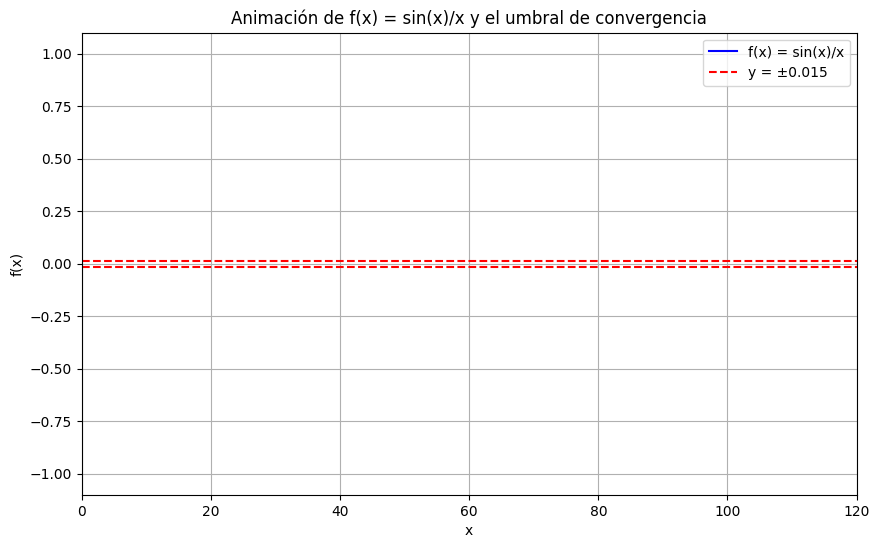

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Definir la función f(x)
def f(x):
    return np.sin(x) / x if x != 0 else 1.0

# Umbral dado
umbral = 0.015
step = 0.01
x = 1.0

# Buscar el primer x_T tal que |f(x)| < umbral para todo x >= x_T
while True:
    valores = [abs(f(x + i * step)) for i in range(1000)]
    if all(valor < umbral for valor in valores):
        x_T = x
        break
    x += step

y_T = f(x_T)

# Generar los datos para la animación
x_vals = np.linspace(1, 100, 400)
y_vals = np.array([f(x) for x in x_vals])

# Crear figura
fig, ax = plt.subplots(figsize=(10, 6))

def animate(i):
    ax.clear()
    ax.set_xlim(0, 120)
    ax.set_ylim(-1.1, 1.1)
    ax.set_title("Animación de f(x) = sin(x)/x y el umbral de convergencia")
    ax.set_xlabel("x")
    ax.set_ylabel("f(x)")
    ax.grid(True)

    # Curva progresiva
    ax.plot(x_vals[:i], y_vals[:i], label="f(x) = sin(x)/x", color='blue')

    # Línea horizontal en y = ±umbral
    ax.axhline(umbral, color='red', linestyle='--', label=f"y = ±{umbral}")
    ax.axhline(-umbral, color='red', linestyle='--')

    # Línea y punto de solución al final de la animación
    if i == len(x_vals):
        ax.axvline(x_T, color='green', linestyle='--', label=f"x_T ≈ {x_T:.4f}")
        ax.scatter(x_T, y_T, color='green', s=60)
        ax.text(x_T, y_T + 0.03, f"({x_T:.2f}, {y_T:.3f})", color='green', ha='center')

    ax.legend(loc="upper right")

# Crear animación
ani = animation.FuncAnimation(fig, animate, frames=len(x_vals) + 1, interval=30, repeat=False)
# Guardar la animación como GIF
ani.save("animacionEjercicio3_.gif", writer='pillow', fps=1)


# Mostrar en Jupyter (reemplaza con ani.save(...) si estás fuera de Jupyter)
HTML(ani.to_jshtml())